#Librerias

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import librosa.display

In [ ]:
!pip install librosa
!pip install catboost
!pip install scikit-optimize
!pip install shap
!pip install pydub

# Montar Carpeta

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import zipfile
import os

# Ruta del archivo ZIP en tu Google Drive
zip_file_path = r'/content/drive/MyDrive/TPS predictivo avanzado/MusicGenre-20231002T180350Z-001.zip'
# Ruta donde quieres extraer los archivos
extract_folder_path = r'/content/drive/MyDrive/TPS predictivo avanzado/musica_unziped'

# Crear la carpeta de extracción si no existe
os.makedirs(extract_folder_path, exist_ok=True)

# Descomprimir el archivo ZIP
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_folder_path)


In [ ]:
music_data = pd.read_csv(r'/content/drive/MyDrive/TPS predictivo avanzado /justo_puto.csv')
music_data.head(5)
music_data['label'].value_counts()

blues        100
country      100
hiphop       100
jazz         100
metal        100
pop          100
reggae       100
rock         100
classical     80
disco         70
Name: label, dtype: int64

#EDA

In [ ]:
music_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 950 entries, 0 to 949
Data columns (total 60 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   filename                 950 non-null    object 
 1   length                   950 non-null    int64  
 2   chroma_stft_mean         950 non-null    float64
 3   chroma_stft_var          950 non-null    float64
 4   rms_mean                 950 non-null    float64
 5   rms_var                  950 non-null    float64
 6   spectral_centroid_mean   950 non-null    float64
 7   spectral_centroid_var    950 non-null    float64
 8   spectral_bandwidth_mean  950 non-null    float64
 9   spectral_bandwidth_var   950 non-null    float64
 10  rolloff_mean             950 non-null    float64
 11  rolloff_var              950 non-null    float64
 12  zero_crossing_rate_mean  950 non-null    float64
 13  zero_crossing_rate_var   950 non-null    float64
 14  harmony_mean             9

##Graficos Amplitud por Genero

Blues


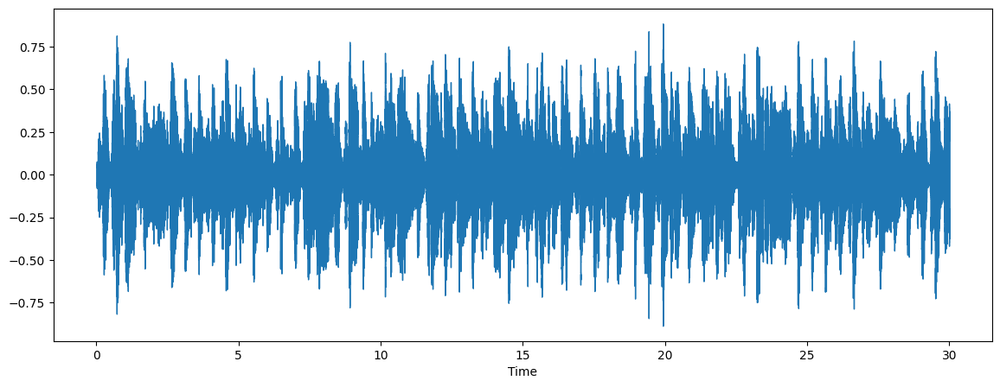

In [ ]:
path = '/content/drive/MyDrive/TPS predictivo avanzado/musica_unziped/MusicGenre/genres_original/blues/blues.00000.wav'
plt.figure(figsize=(14, 5))
x, sr = librosa.load(path)
librosa.display.waveshow(x, sr=sr)
#id.Audio(path)

print("Blues")


Metal


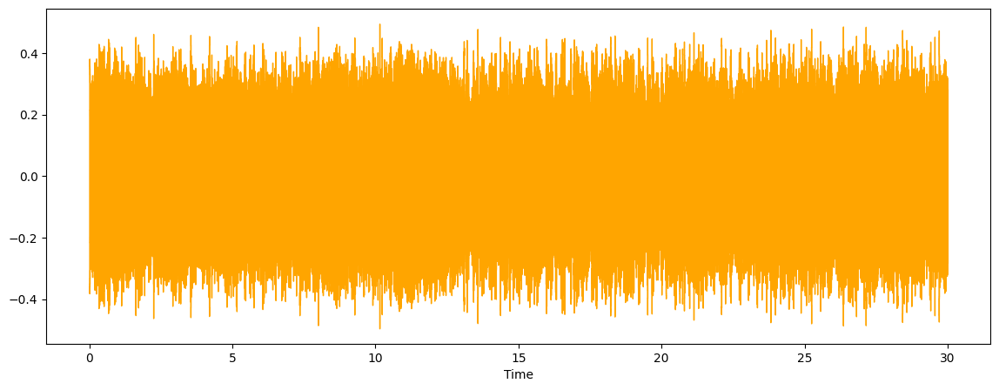

In [ ]:
path = '/content/drive/MyDrive/TPS predictivo avanzado/musica_unziped/MusicGenre/genres_original/metal/metal.00000.wav'
plt.figure(figsize=(14, 5))
x, sr = librosa.load(path)
librosa.display.waveshow(x, sr=sr, color = "orange" )
#id.Audio(path)

print("Metal")

Pop


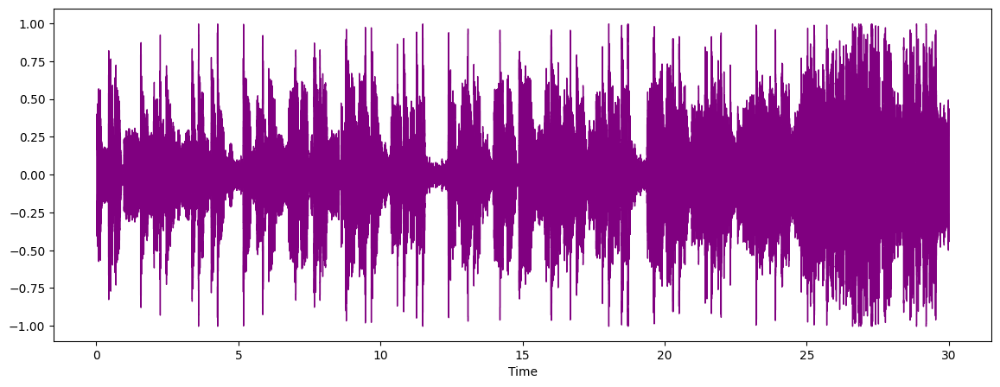

In [ ]:
path = '/content/drive/MyDrive/TPS predictivo avanzado/musica_unziped/MusicGenre/genres_original/pop/pop.00000.wav'
plt.figure(figsize=(14, 5))
x, sr = librosa.load(path)
librosa.display.waveshow(x, sr=sr, color = "purple")
#id.Audio(path)

print("Pop")

classical


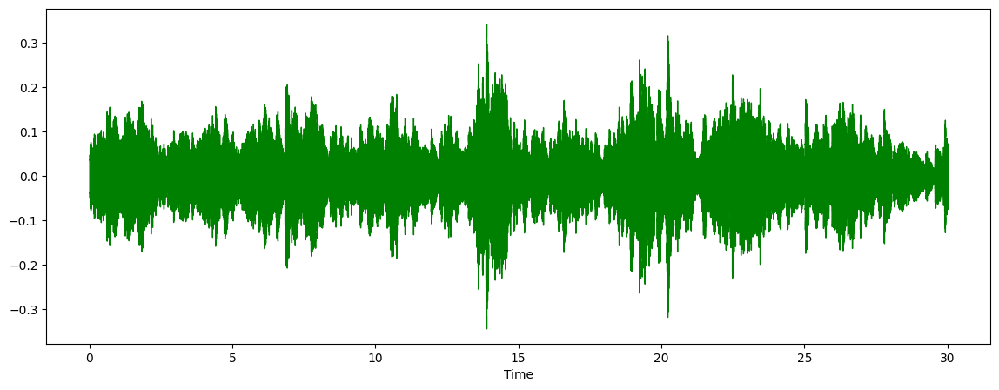

In [ ]:
import librosa

path = '/content/drive/MyDrive/TPS predictivo avanzado/musica_unziped/MusicGenre/genres_original/classical/classical.00000.wav'
plt.figure(figsize=(14, 5))
x, sr = librosa.load(path)
librosa.display.waveshow(x, sr=sr, color="green")
#id.Audio(path)

print("classical")

hiphop


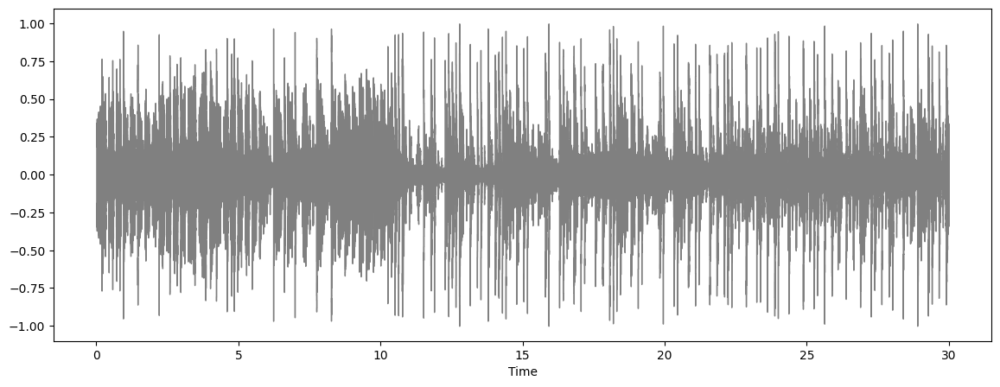

In [ ]:
path = '/content/drive/MyDrive/TPS predictivo avanzado/musica_unziped/MusicGenre/genres_original/hiphop/hiphop.00000.wav'
plt.figure(figsize=(14, 5))
x, sr = librosa.load(path)
librosa.display.waveshow(x, sr=sr, color = "grey")
#id.Audio(path)

print("hiphop")

## EDA DE LAS FEATURES

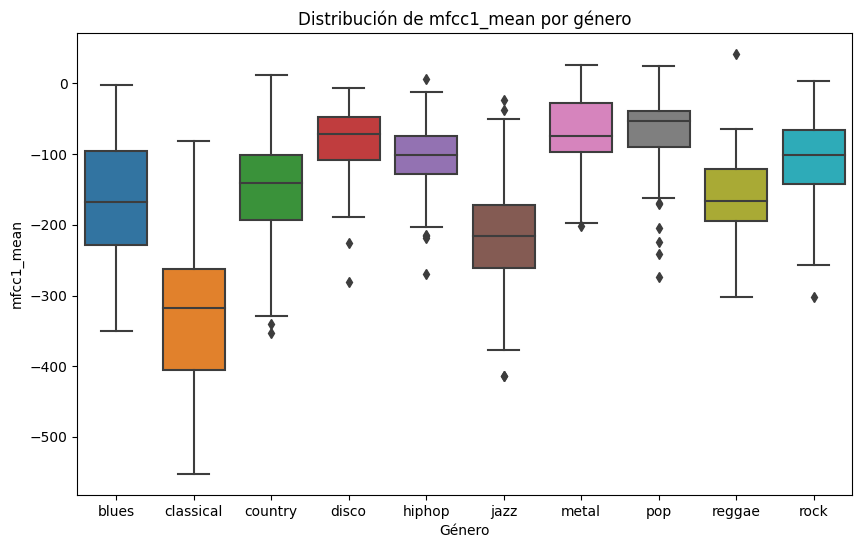

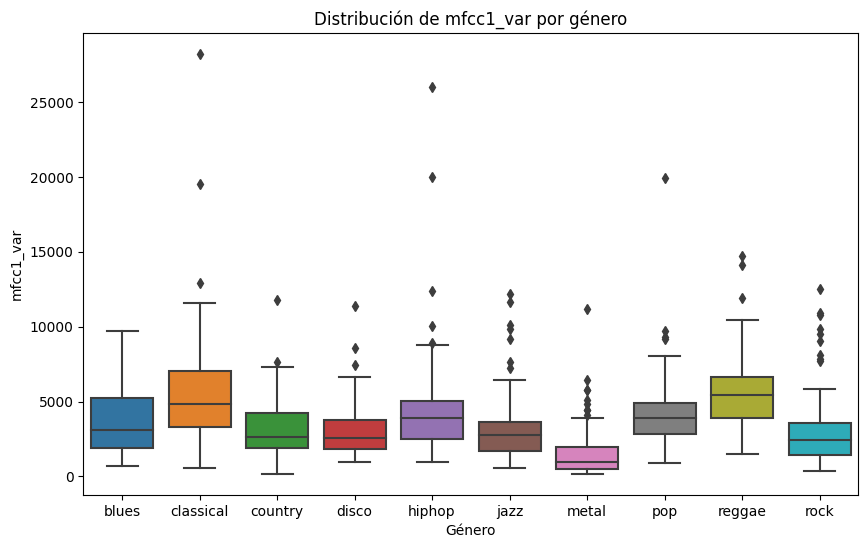

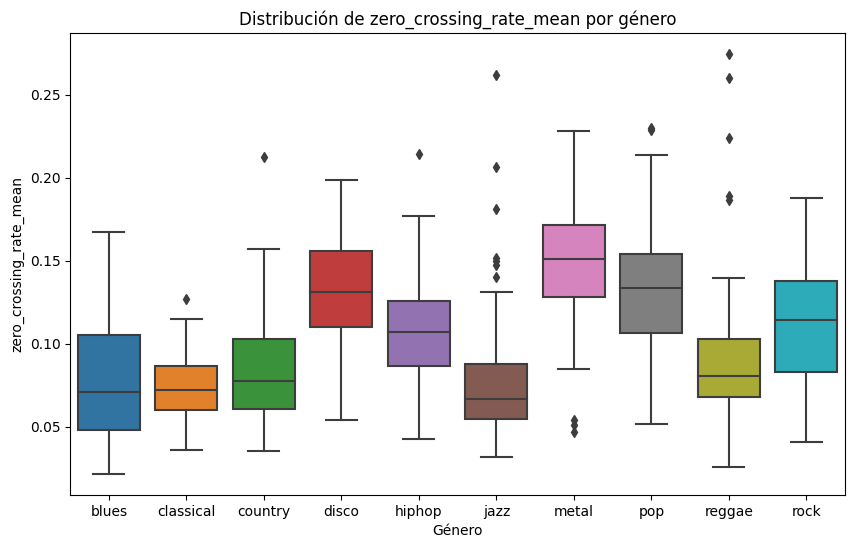

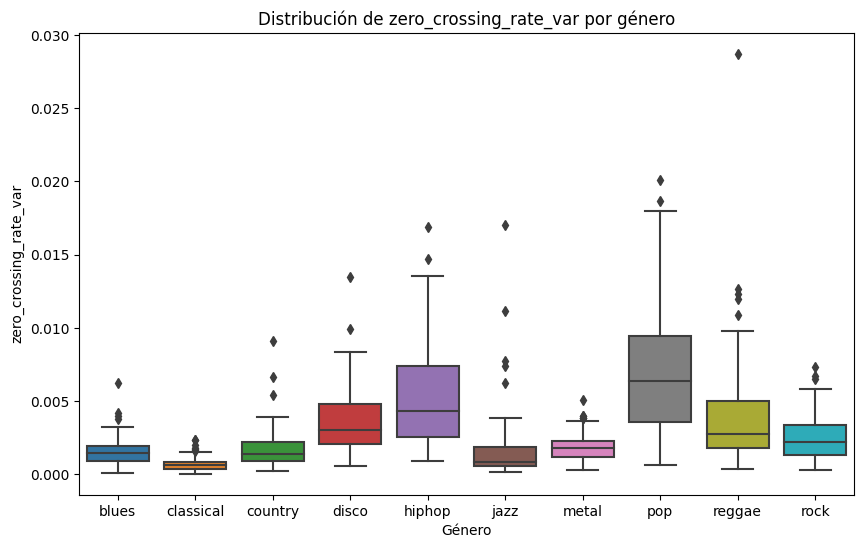

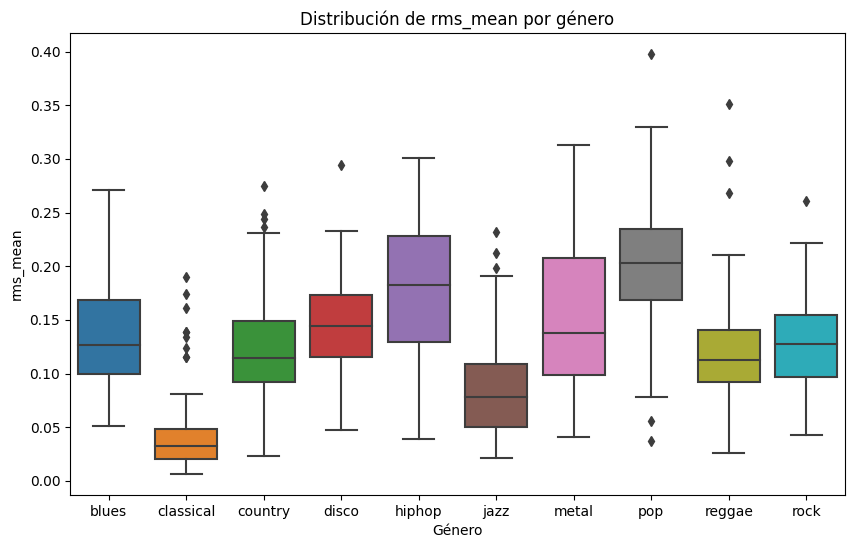

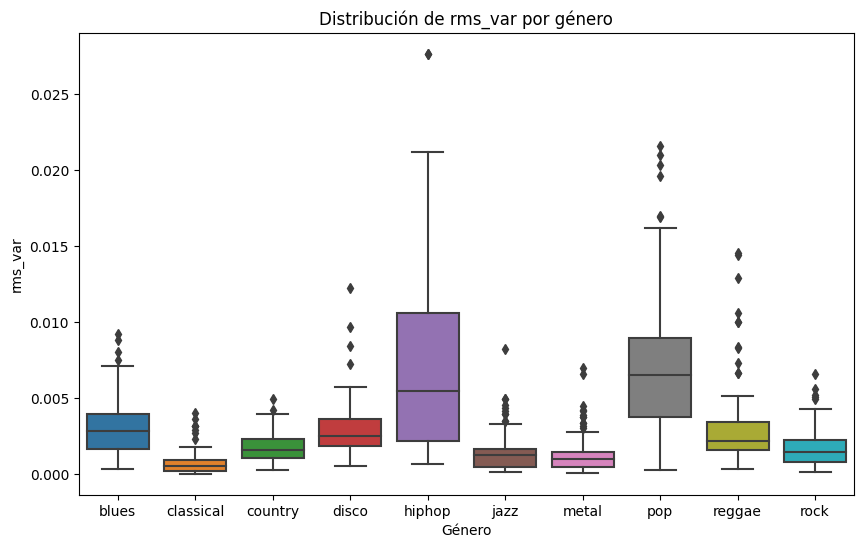

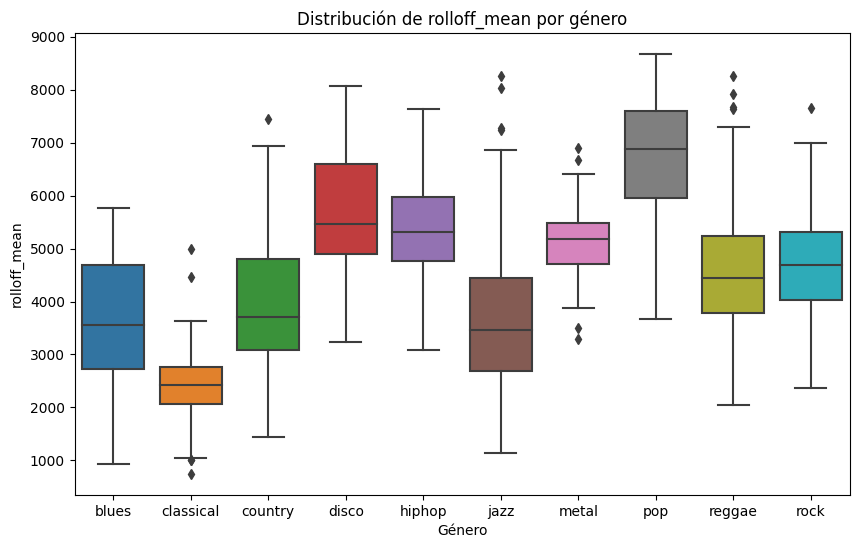

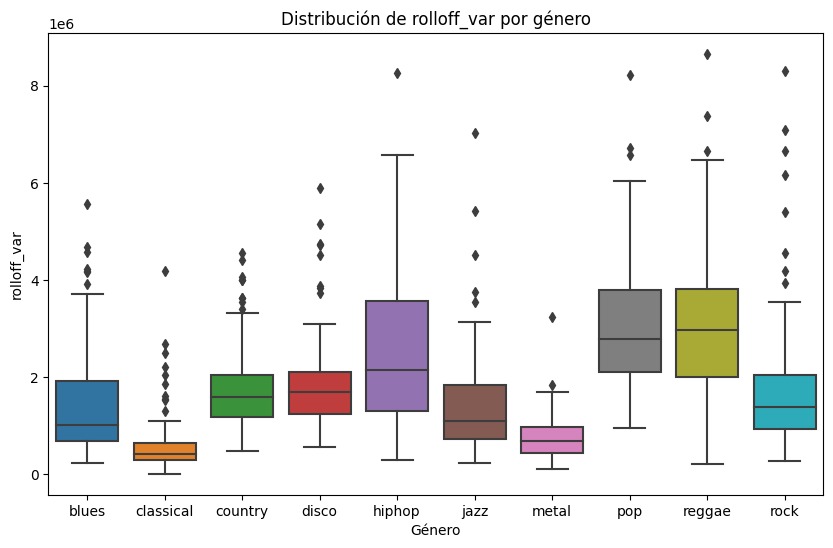

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Cargar tu DataFrame
# df = pd.read_csv('tu_dataset.csv')

# Selecciona las características de interés
features = [
    'mfcc1_mean', 'mfcc1_var', 'zero_crossing_rate_mean', 'zero_crossing_rate_var',
    'rms_mean', 'rms_var', 'rolloff_mean', 'rolloff_var', # y otras características que desees analizar
]

# Itera sobre cada característica y crea un gráfico por género
for feature in features:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='label', y=feature, data=music_data)
    plt.title(f'Distribución de {feature} por género')
    plt.xlabel('Género')
    plt.ylabel(feature)
    plt.show()


### 1. Chroma_STFT:

- Conceptos Básicos: Chroma_STFT se refiere a los coeficientes cromáticos obtenidos a través de la Transformada de Fourier de Tiempo Corto (STFT). Los coeficientes cromáticos representan la energía de cada una de las 12 clases de notas en una octava.

- Relación con Música: Los coeficientes cromáticos son útiles para identificar acordes y armonías en la música. Diferentes géneros musicales tienden a utilizar diferentes combinaciones de notas y acordes, lo que se refleja en los coeficientes cromáticos.

- Interpretación: Géneros con más variedad de notas y acordes tendrán un chroma_stft_mean más alto.

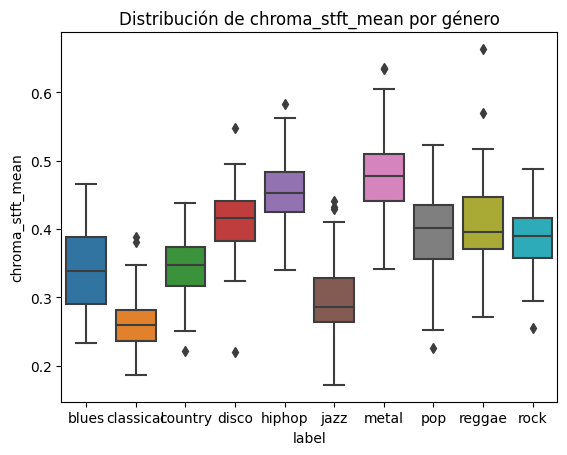

In [ ]:
sns.boxplot(x='label', y='chroma_stft_mean', data=music_data)
plt.title('Distribución de chroma_stft_mean por género')
plt.show()

### 2. RMS (Root Mean Square):

- Conceptos Básicos: RMS es una medida de la magnitud de la señal de audio. rms_mean es el promedio de la energía RMS, mientras que rms_var es la variabilidad de la energía RMS.

- Relación con Música: rms_mean puede indicar la intensidad o volumen percibido de la música. Géneros más fuertes y energéticos tendrán un rms_mean más alto.

- Interpretación: Géneros más suaves y acústicos tendrán un rms_mean más bajo, mientras que géneros más fuertes y electrónicos tendrán un rms_mean más alto

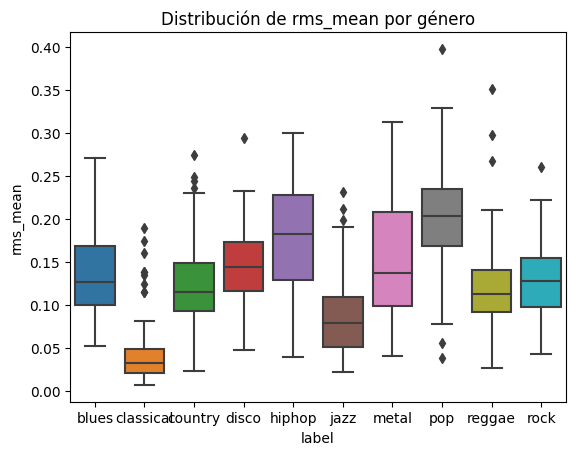

In [ ]:
sns.boxplot(x='label', y='rms_mean', data=music_data)
plt.title('Distribución de rms_mean por género')
plt.show()

#### Outliers RMS

##### MIN RMS

In [ ]:
import pandas as pd

# Supongamos que tienes un DataFrame llamado 'music_data' con las columnas 'filename', 'label' y 'rms_value'.
# Reemplaza 'music_data' con el nombre real de tu DataFrame y 'rms_value' con el nombre real de la columna de RMS.

# Encuentra el registro con el mayor valor de RMS
min_rms_record = music_data.loc[music_data['rms_mean'].idxmin()]

# Obtén el nombre del archivo y el género correspondiente
filename_with_min_rms = min_rms_record['filename']
genre_of_min_rms = min_rms_record['label']

print(f"Registro con el mayor valor de RMS:")
print(f"Nombre del archivo: {filename_with_min_rms}")
print(f"Género: {genre_of_min_rms}")

Registro con el mayor valor de RMS:
Nombre del archivo: classical.00078.wav
Género: classical


In [ ]:
from IPython.display import Audio

# Ruta al archivo .wav en Google Colab
file_path = '/content/drive/MyDrive/TPS predictivo avanzado/musica_unziped/MusicGenre/genres_original/classical/classical.00078.wav'

# Reproducir el archivo de audio
Audio(file_path)



##### MAX RMS

In [ ]:
import pandas as pd

# Supongamos que tienes un DataFrame llamado 'music_data' con las columnas 'filename', 'label' y 'rms_value'.
# Reemplaza 'music_data' con el nombre real de tu DataFrame y 'rms_value' con el nombre real de la columna de RMS.

# Encuentra el registro con el mayor valor de RMS
max_rms_record = music_data.loc[music_data['rms_mean'].idxmax()]

# Obtén el nombre del archivo y el género correspondiente
filename_with_max_rms = max_rms_record['filename']
genre_of_max_rms = max_rms_record['label']

print(f"Registro con el mayor valor de RMS:")
print(f"Nombre del archivo: {filename_with_max_rms}")
print(f"Género: {genre_of_max_rms}")

Registro con el mayor valor de RMS:
Nombre del archivo: pop.00062.wav
Género: pop


In [ ]:
from IPython.display import Audio

# Ruta al archivo .wav en Google Colab
file_path = '/content/drive/MyDrive/TPS predictivo avanzado/musica_unziped/MusicGenre/genres_original/pop/pop.00062.wav'

# Reproducir el archivo de audio
Audio(file_path)



### 3. MFCC (Mel Frequency Cepstral Coefficients):

- Conceptos Básicos: Los MFCC son coeficientes que representan el espectro de potencia de un sonido. mfccX_mean es el promedio de cada coeficiente, mientras que mfccX_var es la variabilidad de cada coeficiente.

- Relación con Música: Los MFCC capturan características únicas de los instrumentos y voces en una pista, siendo útiles para distinguir entre diferentes géneros musicales.

- Interpretación: Diferentes géneros tendrán distintos patrones de MFCC debido a las variaciones en las firmas espectrales entre géneros.

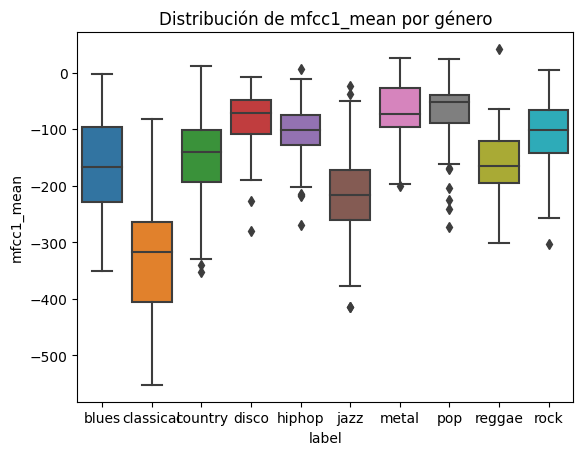

In [ ]:
sns.boxplot(x='label', y='mfcc1_mean', data=music_data)
plt.title('Distribución de mfcc1_mean por género')
plt.show()

### 4. Zero Crossing Rate:

- Conceptos Básicos: El Zero Crossing Rate (ZCR) es la tasa a la que la señal cambia de positivo a negativo o viceversa. zero_crossing_rate_mean representa el promedio de la tasa de cruces por cero en la señal, mientras que zero_crossing_rate_var indica cuánto varía esta tasa.

- Relación con Música: Un alto ZCR podría indicar sonidos percusivos o ruidosos, mientras que un bajo ZCR podría estar asociado con sonidos más suaves y sostenidos. Esto es útil para diferenciar entre géneros musicales.

- Interpretacion: Géneros con más elementos percusivos o ruidosos, como el rock o la música electrónica, podrían tener un ZCR más alto en comparación con géneros más melódicos y armónicos.

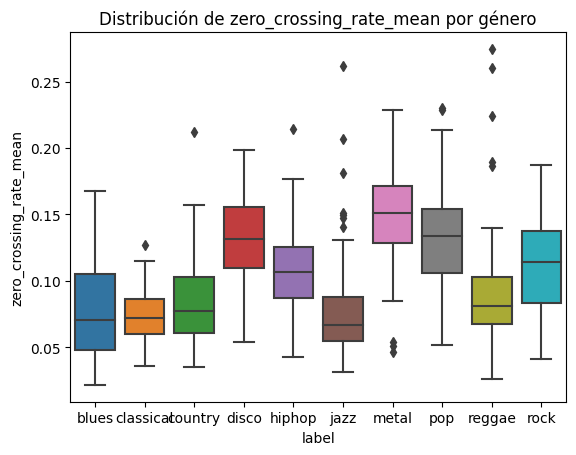

In [ ]:
sns.boxplot(x='label', y='zero_crossing_rate_mean', data= music_data)
plt.title('Distribución de zero_crossing_rate_mean por género')
plt.show()

#### Outliers ZCR

##### MIN ZCR

In [ ]:
import pandas as pd

# Supongamos que tienes un DataFrame llamado 'music_data' con las columnas 'filename', 'label' y 'zero_crossing_rate_value'.
# Reemplaza 'music_data' con el nombre real de tu DataFrame y 'zero_crossing_rate_value' con el nombre real de la columna de zero_crossing_rate.

# Encuentra el registro con el mayor valor de zero_crossing_rate
min_zero_crossing_rate_record = music_data.loc[music_data['zero_crossing_rate_mean'].idxmin()]

# Obtén el nombre del archivo y el género correspondiente
filename_with_min_zero_crossing_rate = min_zero_crossing_rate_record['filename']
genre_of_min_zero_crossing_rate = min_zero_crossing_rate_record['label']

print(f"Registro con el menor valor de zero_crossing_rate:")
print(f"Nombre del archivo: {filename_with_min_zero_crossing_rate}")
print(f"Género: {genre_of_min_zero_crossing_rate}")

Registro con el mayor valor de zero_crossing_rate:
Nombre del archivo: blues.00093.wav
Género: blues


In [ ]:
from IPython.display import Audio

# Ruta al archivo .wav en Google Colab
file_path = '/content/drive/MyDrive/TPS predictivo avanzado/musica_unziped/MusicGenre/genres_original/blues/blues.00093.wav'

# Reproducir el archivo de audio
Audio(file_path)



##### MAX ZCR

In [ ]:
import pandas as pd

# Supongamos que tienes un DataFrame llamado 'music_data' con las columnas 'filename', 'label' y 'zero_crossing_rate_value'.
# Reemplaza 'music_data' con el nombre real de tu DataFrame y 'zero_crossing_rate_value' con el nombre real de la columna de zero_crossing_rate.

# Encuentra el registro con el mayor valor de zero_crossing_rate
max_zero_crossing_rate_record = music_data.loc[music_data['zero_crossing_rate_mean'].idxmax()]

# Obtén el nombre del archivo y el género correspondiente
filename_with_max_zero_crossing_rate = max_zero_crossing_rate_record['filename']
genre_of_max_zero_crossing_rate = max_zero_crossing_rate_record['label']

print(f"Registro con el mayor valor de zero_crossing_rate:")
print(f"Nombre del archivo: {filename_with_max_zero_crossing_rate}")
print(f"Género: {genre_of_max_zero_crossing_rate}")

Registro con el mayor valor de zero_crossing_rate:
Nombre del archivo: reggae.00051.wav
Género: reggae


In [ ]:
from IPython.display import Audio

# Ruta al archivo .wav en Google Colab
file_path = '/content/drive/MyDrive/TPS predictivo avanzado/musica_unziped/MusicGenre/genres_original/reggae/reggae.00051.wav'

# Reproducir el archivo de audio
Audio(file_path)



### 5. Tempo:

- Conceptos Básicos: El tempo se refiere a la velocidad o el ritmo de una pieza musical. En tu dataset, tempo probablemente represente el tempo promedio estimado a lo largo de la pista.

- Relación con Música: El tempo es fundamental para el carácter y el estilo de una pieza musical. Diferentes géneros tienden a favorecer diferentes tempos.

- Interpretacion: Géneros como el techno o el drum and bass podrían tener tempos más rápidos, mientras que géneros como el blues o el soul podrían tener tempos más lentos.

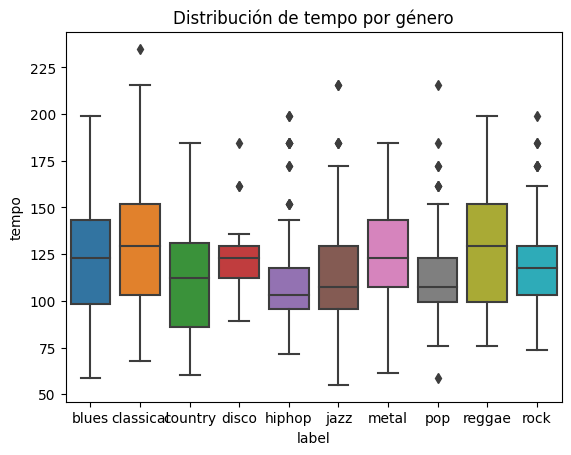

In [ ]:
sns.boxplot(x='label', y='tempo', data = music_data)
plt.title('Distribución de tempo por género')
plt.show()

#### Outliers Tempo

##### MIN Tempo

In [ ]:
import pandas as pd

# Supongamos que tienes un DataFrame llamado 'music_data' con las columnas 'filename', 'label' y 'tempo'.
# Reemplaza 'music_data' con el nombre real de tu DataFrame y 'tempo' con el nombre real de la columna de tempo.

# Encuentra el registro con el mayor valor de tempo
min_tempo_record = music_data.loc[music_data['tempo'].idxmin()]

# Obtén el nombre del archivo y el género correspondiente
filename_with_min_tempo = min_tempo_record['filename']
genre_of_min_tempo = min_tempo_record['label']

print(f"Registro con el menor valor de tempo:")
print(f"Nombre del archivo: {filename_with_min_tempo}")
print(f"Género: {genre_of_min_tempo}")

Registro con el menor valor de tempo:
Nombre del archivo: jazz.00089.wav
Género: jazz


In [ ]:
from IPython.display import Audio

# Ruta al archivo .wav en Google Colab
file_path = '/content/drive/MyDrive/TPS predictivo avanzado/musica_unziped/MusicGenre/genres_original/jazz/jazz.00089.wav'

# Reproducir el archivo de audio
Audio(file_path)



##### MAX Tempo

In [ ]:
import pandas as pd

# Supongamos que tienes un DataFrame llamado 'music_data' con las columnas 'filename', 'label' y 'tempo_value'.
# Reemplaza 'music_data' con el nombre real de tu DataFrame y 'tempo_value' con el nombre real de la columna de tempo.

# Encuentra el registro con el mayor valor de tempo
max_tempo_record = music_data.loc[music_data['tempo'].idxmax()]

# Obtén el nombre del archivo y el género correspondiente
filename_with_max_tempo = max_tempo_record['filename']
genre_of_max_tempo = max_tempo_record['label']

print(f"Registro con el mayor valor de tempo:")
print(f"Nombre del archivo: {filename_with_max_tempo}")
print(f"Género: {genre_of_max_tempo}")

Registro con el mayor valor de tempo:
Nombre del archivo: classical.00009.wav
Género: classical


In [ ]:
from IPython.display import Audio

# Ruta al archivo .wav en Google Colab
file_path = '/content/drive/MyDrive/TPS predictivo avanzado/musica_unziped/MusicGenre/genres_original/classical/classical.00009.wav'

# Reproducir el archivo de audio
Audio(file_path)



### Analisis descriptivo de modelos con PCA

In [ ]:
from sklearn.preprocessing import StandardScaler

# Seleccionar características numéricas
features_pca = music_data.drop(columns=['filename', 'label'])

# Estandarizar características
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features_pca)

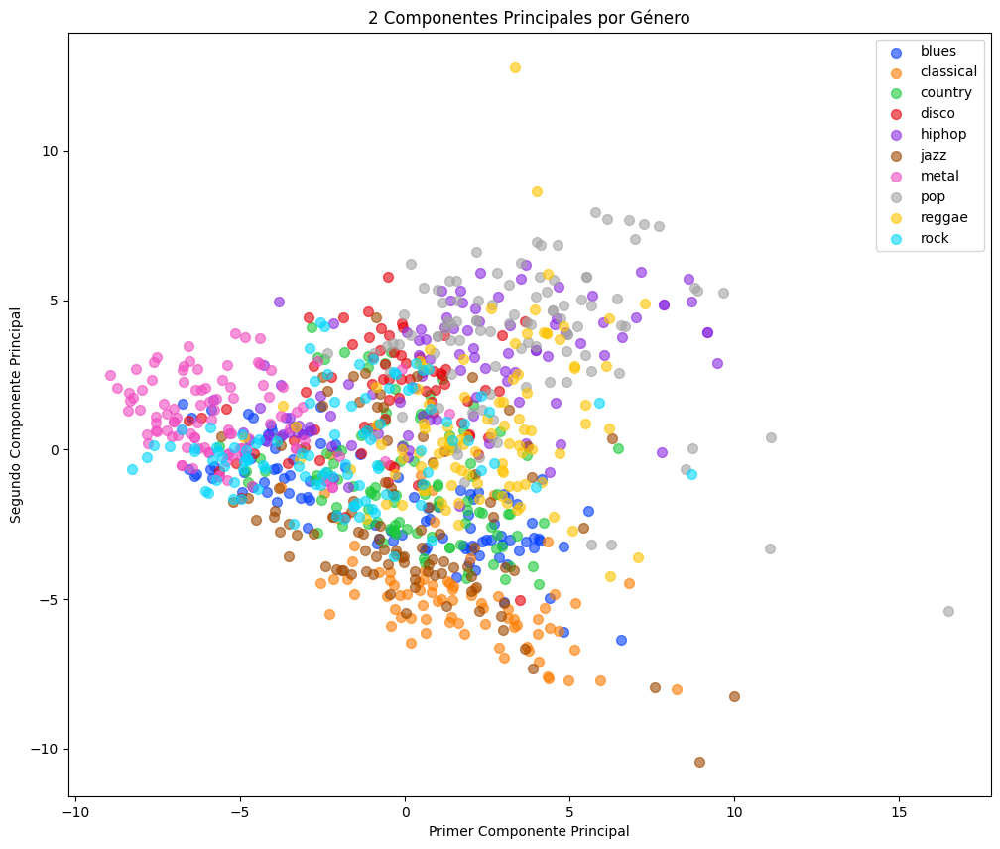

In [ ]:
from sklearn.decomposition import PCA

# Aplicar PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(scaled_features)

# Visualizar resultados de PCA
principal_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])
final_df = pd.concat([principal_df, music_data['label']], axis=1)

# Graficar los componentes principales por género
plt.figure(figsize=(12, 10))

# Definir una paleta de colores
palette = sns.color_palette("bright", len(final_df['label'].unique()))

for idx, genre in enumerate(final_df['label'].unique()):
    indices = final_df['label'] == genre
    plt.scatter(final_df.loc[indices, 'PC1'], final_df.loc[indices, 'PC2'], label=genre,
                alpha=0.6, s=50, color=palette[idx])  # Ajustar alpha (transparencia) y s (tamaño)

plt.title('2 Componentes Principales por Género')
plt.xlabel('Primer Componente Principal')
plt.ylabel('Segundo Componente Principal')
plt.legend()
plt.show()



### Analisis descriptivo con T-SNE

- t-SNE (t-Distributed Stochastic Neighbor Embedding) es una técnica de reducción de dimensionalidad que es particularmente útil para visualizar datos de alta dimensión en un espacio de dos o tres dimensiones. t-SNE trabaja minimizando la divergencia entre dos distribuciones de probabilidad: una que mide las similitudes entre pares de objetos en el espacio de entrada original y otra que mide las similitudes entre los mismos objetos en el espacio de baja dimensión.

- Observa los clusters formados en el gráfico. Si los puntos de un género tienden a agruparse, significa que las canciones de ese género tienen características similares.

- Los clusters bien definidos indican una buena separación entre géneros, mientras que los clusters superpuestos sugieren similitudes entre géneros.


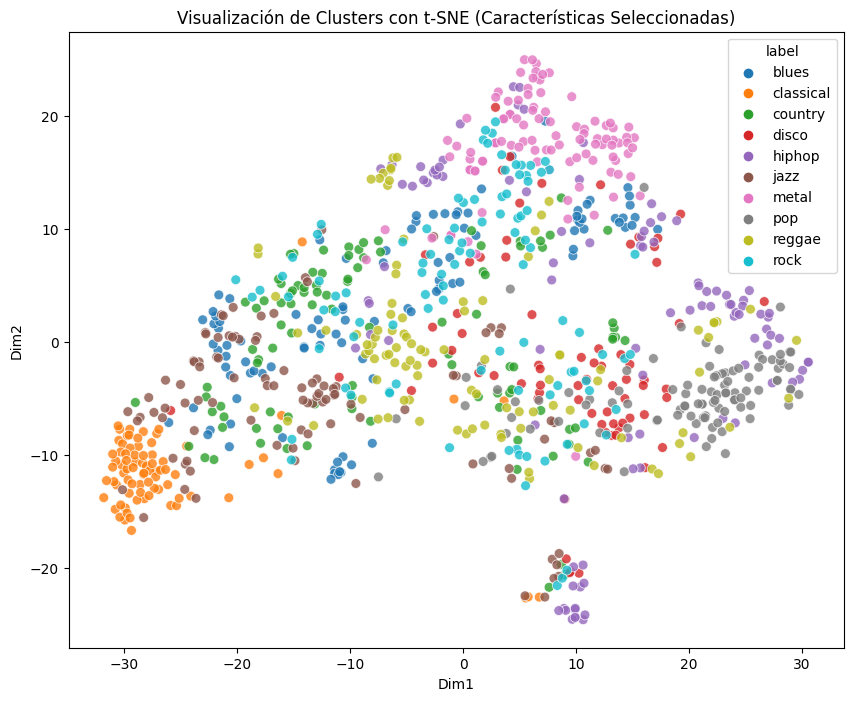

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.manifold import TSNE
import seaborn as sns

# Paso 1: Cargar el DataFrame
# NOTA: Reemplaza este paso con tu propio código de carga de datos
# df = pd.read_csv('tu_dataset.csv')

# Paso 2: Selecciona y escala las características numéricas
features = music_data.drop(columns=['filename', 'label'])
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

# Paso 3: Entrena un clasificador de Random Forest con parámetros ajustados
# Aumenta el número de estimadores y la profundidad máxima para mejorar el rendimiento
clf = RandomForestClassifier(n_estimators=500, max_depth=15, random_state=42)
clf.fit(scaled_features, music_data['label'])
feature_importances = clf.feature_importances_

# Paso 4: Selecciona las características más importantes
top_n_features = 10
indices = feature_importances.argsort()[-top_n_features:][::-1]
selected_features = scaled_features[:, indices]

# Paso 5: Aplica t-SNE con parámetros ajustados
# Ajusta la perplexity y el learning_rate para mejorar la visualización
tsne = TSNE(n_components=2, perplexity=50, n_iter=5000, learning_rate=10)
tsne_result = tsne.fit_transform(selected_features)

# Paso 6: Visualiza los resultados
tsne_df = pd.DataFrame(tsne_result, columns=['Dim1', 'Dim2'])
tsne_df['label'] = music_data['label']
plt.figure(figsize=(10, 8))
sns.scatterplot(x='Dim1', y='Dim2', hue='label', data=tsne_df, palette='tab10', s=50, alpha=0.8)
plt.title('Visualización de Clusters con t-SNE (Características Seleccionadas)')
plt.show()

In [ ]:
music_data.columns

### Corr Variables

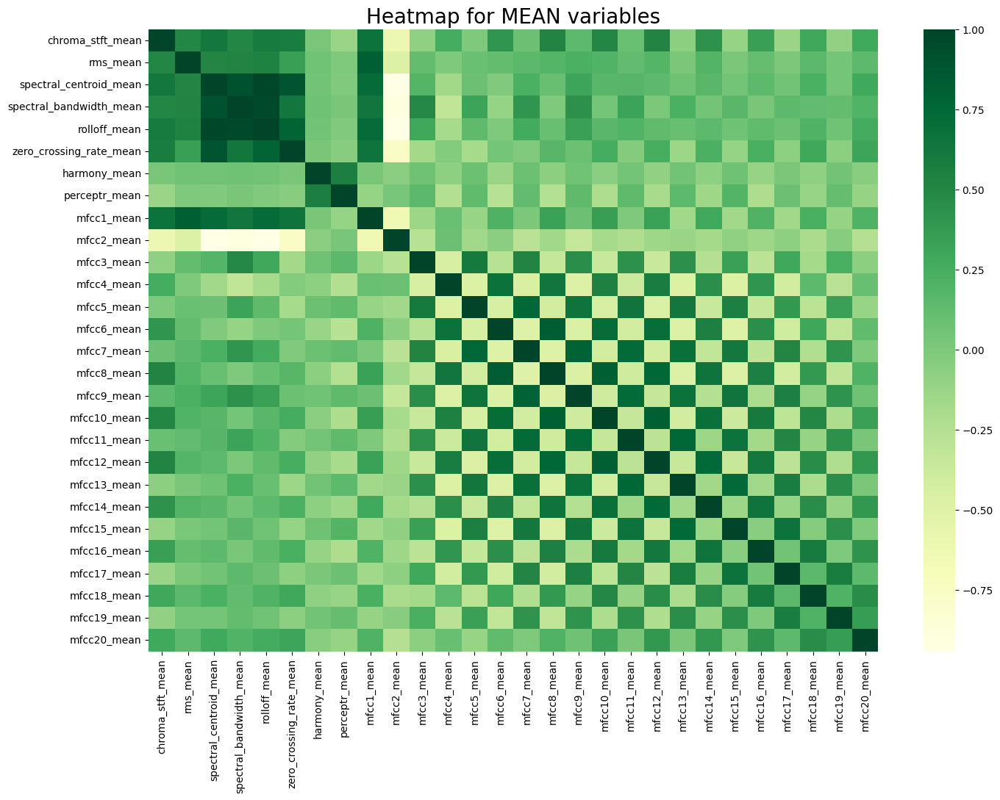

In [ ]:
import numpy as np
import seaborn as sns

# Computing the Correlation Matrix
spike_cols = [col for col in music_data.columns if 'mean' in col]

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(16, 11));

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(music_data[spike_cols].corr(), cmap='YlGn')

plt.title('Heatmap for MEAN variables', fontsize = 20)
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10);

#Preprocesamiento

In [ ]:
from sklearn import preprocessing
label_encoder = preprocessing.LabelEncoder()
music_data['label'] = label_encoder.fit_transform(music_data['label'])


# Busqueda PIPES


In [ ]:
music_data['label'].value_counts()

0    100
2    100
4    100
5    100
6    100
7    100
8    100
9    100
1     80
3     70
Name: label, dtype: int64

In [ ]:
# from sklearn.model_selection import train_test_split
# from sklearn.preprocessing import StandardScaler
# from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
# from xgboost import XGBClassifier
# from catboost import CatBoostClassifier
# from imblearn.over_sampling import SMOTE
# from imblearn.under_sampling import RandomUnderSampler
# from imblearn.pipeline import Pipeline
# from sklearn.metrics import f1_score, make_scorer
# from skopt import BayesSearchCV

# # Cargar tus datos
# # ...

# # Preprocesamiento de datos
# X = music_data.drop(columns=['filename', 'label'])
# y = music_data['label']
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# # Definir una métrica personalizada para F1-score con average='weighted'
# f1_scorer = make_scorer(f1_score, average='weighted')


# # Definir modelos, transformers y técnicas de balanceo
# models = [RandomForestClassifier(), XGBClassifier(), ExtraTreesClassifier()]
# samplers = [SMOTE(), RandomUnderSampler()]
# scalers = [StandardScaler()]

# best_f1 = 0
# best_pipe = None

# # Bucle a través de todas las combinaciones
# for model in models:
#     for sampler in samplers:
#         for scaler in scalers:
#             # Mensaje para mostrar la combinación actual
#             print(f"Probando: Modelo - {model.__class__.__name__}, Sampler - {sampler.__class__.__name__}, Scaler - {scaler.__class__.__name__}")

#             pipeline = Pipeline([
#                 ('scaler', scaler),
#                 ('sampler', sampler),
#                 ('model', model)
#             ])

#             # Definir rangos de hiperparámetros para la búsqueda bayesiana
#             param_space = {
#                 'model__n_estimators': (100, 1000),  # Ampliado el rango
#                 'model__max_depth': (5, 50),  # Ampliado el rango
#                 'model__min_samples_split': (2, 20),  # Ampliado el rango
#                 'model__min_samples_leaf': (1, 20),  # Ampliado el rango
#             }

#             # Realizar la búsqueda de hiperparámetros utilizando el método bayesiano
#             bayes_search = BayesSearchCV(
#                 pipeline,
#                 param_space,
#                 scoring=f1_scorer,
#                 cv=5,
#                 n_iter=50,  # Número de iteraciones de optimización (aumentado)
#                 random_state=42,
#                 n_jobs=-1  # Utiliza todos los núcleos disponibles
#             )

#             bayes_search.fit(X_train, y_train)

#             # Mejor modelo seleccionado
#             best_model = bayes_search.best_estimator_

#             # Evaluar el modelo en el conjunto de prueba
#             y_pred = best_model.predict(X_test)
#             f1 = f1_score(y_test, y_pred, average='weighted')

#             # Actualizar el mejor modelo si es necesario
#             if f1 > best_f1:
#                 best_f1 = f1
#                 best_pipe = best_model

#             print(f"Resultado F1 Score: {f1}")

# print(f"Mejor F1 Score: {best_f1}")
# print(f"Mejor pipeline: {best_pipe}")
# print(f"Mejores Hiperparámetros: {bayes_search.best_params_}")

Probando: Modelo - RandomForestClassifier, Sampler - SMOTE, Scaler - StandardScaler


/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Resultado F1 Score: 0.7929670894144578
Probando: Modelo - RandomForestClassifier, Sampler - RandomUnderSampler, Scaler - StandardScaler


/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/usr/local/lib/python3.10/dist

Resultado F1 Score: 0.7465691483310126
Probando: Modelo - XGBClassifier, Sampler - SMOTE, Scaler - StandardScaler


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [03:24:17] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


Resultado F1 Score: 0.7662187171955431
Probando: Modelo - XGBClassifier, Sampler - RandomUnderSampler, Scaler - StandardScaler


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [03:31:50] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


Resultado F1 Score: 0.7301888671063196
Probando: Modelo - ExtraTreesClassifier, Sampler - SMOTE, Scaler - StandardScaler


/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/usr/local/lib/python3.10/dist

Resultado F1 Score: 0.7763246510990872
Probando: Modelo - ExtraTreesClassifier, Sampler - RandomUnderSampler, Scaler - StandardScaler


/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/usr/local/lib/python3.10/dist

Resultado F1 Score: 0.7329404881229565
Mejor F1 Score: 0.7929670894144578
Mejor pipeline: Pipeline(steps=[('scaler', StandardScaler()), ('sampler', SMOTE()),
                ('model',
                 RandomForestClassifier(max_depth=37, n_estimators=618))])
Mejores Hiperparámetros: OrderedDict([('model__max_depth', 33), ('model__min_samples_leaf', 1), ('model__min_samples_split', 2), ('model__n_estimators', 1000)])


In [ ]:
!pip install catboost
!pip install scikit-optimize

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline
from sklearn.metrics import f1_score, make_scorer
from skopt import BayesSearchCV
from sklearn.preprocessing import LabelEncoder


# Preprocesamiento de datos
X = music_data.drop(columns=['filename', 'label'])
y = music_data['label']
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Definir una métrica personalizada para F1-score con average='weighted'
f1_scorer = make_scorer(f1_score, average='weighted')


# Definir modelos, transformers y técnicas de balanceo
models = [RandomForestClassifier(), XGBClassifier(), ExtraTreesClassifier()]
samplers = [SMOTE(), RandomUnderSampler()]
scalers = [StandardScaler()]

best_f1 = 0
best_pipe = None

# Bucle a través de todas las combinaciones
for model in models:
    for sampler in samplers:
        for scaler in scalers:
            # Mensaje para mostrar la combinación actual
            print(f"Probando: Modelo - {model.__class__.__name__}, Sampler - {sampler.__class__.__name__}, Scaler - {scaler.__class__.__name__}")

            pipeline = Pipeline([
                ('scaler', scaler),
                ('sampler', sampler),
                ('model', model)
            ])

            # Definir rangos de hiperparámetros para la búsqueda bayesiana
            param_space = {
                'model__n_estimators': (100, 2000),
                'model__max_depth': (5, 50),
                'model__min_samples_split': (2, 20),
                'model__min_samples_leaf': (1, 20),
            }

            # Realizar la búsqueda de hiperparámetros utilizando el método bayesiano
            bayes_search = BayesSearchCV(
                pipeline,
                param_space,
                scoring=f1_scorer,
                cv=5,
                n_iter=60,  # Número de iteraciones de optimización
                random_state=42,
                n_jobs=-1  # Utiliza todos los núcleos disponibles
            )

            bayes_search.fit(X_train, y_train)

            # Mejor modelo seleccionado
            best_model = bayes_search.best_estimator_

            # Evaluar el modelo en el conjunto de prueba
            y_pred = best_model.predict(X_test)
            f1 = f1_score(y_test, y_pred, average='weighted')

            # Actualizar el mejor modelo si es necesario
            if f1 > best_f1:
                best_f1 = f1
                best_pipe = best_model

            print(f"Resultado F1 Score: {f1}")

print(f"Mejor F1 Score: {best_f1}")
print(f"Mejor pipeline: {best_pipe}")
print(f"Mejores Hiperparámetros: {bayes_search.best_params_}")

In [ ]:
!pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.9/547.9 kB 5.4 MB/s eta 0:00:00


In [ ]:
import numpy as np
import shap
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from imblearn.over_sampling import SMOTE
from xgboost import XGBClassifier
from sklearn.ensemble import ExtraTreesClassifier
from imblearn.pipeline import Pipeline


music_data = pd.read_csv(r'/content/drive/MyDrive/TPS predictivo avanzado /justo_puto.csv')

# Codificación de las etiquetas de género
label_encoder = LabelEncoder()
music_data['label'] = label_encoder.fit_transform(music_data['label'])
X = music_data.drop(['label', 'filename'], axis=1)
y = music_data['label']

# Divide tus datos
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Aplica SMOTE a los datos de entrenamiento
sampler = SMOTE()
X_resampled, y_resampled = sampler.fit_resample(X_train, y_train)

# Define y entrena tu pipeline
scaler = StandardScaler()
model = ExtraTreesClassifier(
    max_depth=39,
    min_samples_leaf=1,
    min_samples_split=2,
    n_estimators=834
)

pipeline = Pipeline([
    ('scaler', scaler),
    ('model', model)
])

pipeline.fit(X_resampled, y_resampled)

# Calcula y muestra la métrica F1
y_pred = pipeline.predict(X_test)
f1 = f1_score(y_test, y_pred, average='weighted')
print(f"F1 Score: {f1}")

F1 Score: 0.7717615208982346


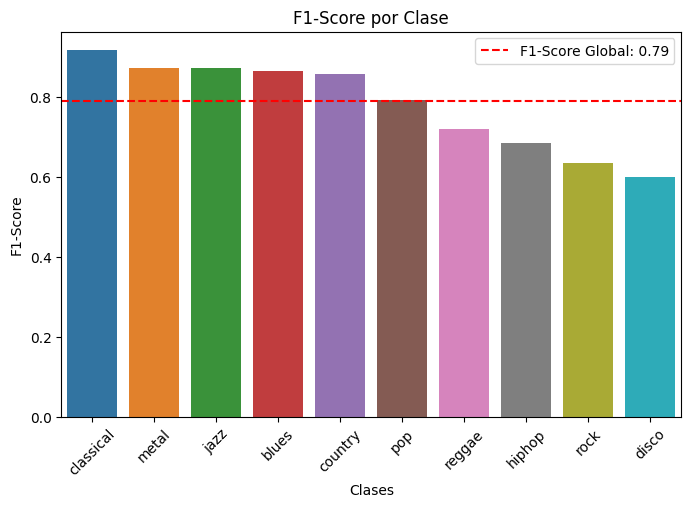

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import f1_score

# Calcula el F1-Score para cada clase
f1_scores_per_class = f1_score(y_test, y_pred, average=None)

# Ordena los F1-Scores y las clases de forma descendente
sorted_indices = np.argsort(f1_scores_per_class)[::-1]
sorted_f1_scores = f1_scores_per_class[sorted_indices]
sorted_classes = label_encoder.classes_[sorted_indices]

# Visualización del F1-Score ordenado
plt.figure(figsize=(8, 5))
sns.barplot(x=sorted_classes, y=sorted_f1_scores)
plt.title('F1-Score por Clase')
plt.xlabel('Clases')
plt.ylabel('F1-Score')
plt.xticks(rotation=45)

# Añade una línea horizontal para el F1-Score global
global_f1_score = 0.79
plt.axhline(y=global_f1_score, color='r', linestyle='--', label=f'F1-Score Global: {global_f1_score:.2f}')
plt.legend()

plt.show()


In [ ]:
from sklearn.metrics import accuracy_score, mean_squared_error
accuracy = accuracy_score(y_test, y_pred)
print(f"Acc: {accuracy}")

Acc: 0.7842105263157895


# Analisis de resultados

## Analisis de clasificaicon del modelo

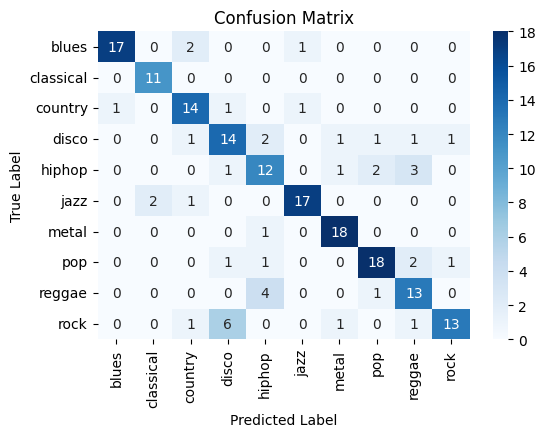

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

# Assuming music_data is already defined and has the 'filename' and 'label' columns
X = music_data.drop(columns=['filename', 'label'])
y = music_data['label']
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Assuming best_model is already defined and trained
y_pred = best_model.predict(X_test)

# Decode the encoded labels back to original string labels
cm = confusion_matrix(label_encoder.inverse_transform(y_test), label_encoder.inverse_transform(y_pred))

# Plot the confusion matrix
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()


In [ ]:
best_model

Pipeline(steps=[('scaler', StandardScaler()), ('sampler', RandomUnderSampler()),
                ('model',
                 ExtraTreesClassifier(max_depth=39, n_estimators=834))])

## Anlaiais de features del modelo


### Analisis SHAP

In [ ]:
pip install shap

In [ ]:
import shap

# Explicación SHAP

# Extract the final estimator from the pipeline
final_estimator = best_model.named_steps['model']

# Create a SHAP explainer with the final estimator
explainer = shap.Explainer(final_estimator)

# Since the model was trained on scaled data, you need to scale the test data before explaining
scaled_X_test = best_model.named_steps['scaler'].transform(X_test)

# Compute SHAP values
shap_values = explainer(scaled_X_test)


# Calcula la importancia promedio de las características para cada clase
mean_shap_values_per_class = [np.abs(shap_values[i].values).mean(axis=0) for i in range(len(shap_values))]

# Convierte la importancia promedio a un array de NumPy para facilitar la comparación
mean_shap_values_array = np.array(mean_shap_values_per_class)

# Encuentra las características más importantes para cada clase en comparación con el resto
unique_labels = np.unique(y_test)
for i in unique_labels:
    # Calcula la diferencia entre la importancia de la clase actual y la importancia promedio del resto de clases
    difference = mean_shap_values_array[i, :] - np.mean(np.delete(mean_shap_values_array, i, axis=0), axis=0)

    # Ordena las características por la diferencia calculada
    sorted_indices = np.argsort(-difference)

    # Imprime las características más importantes para la clase actual
    print(f"Class {i} (Genre {label_encoder.inverse_transform([i])[0]}):")
    for j in sorted_indices[:10]:  # Cambia 10 por el número de características que quieras mostrar
        print(f"  Feature {X_test.columns[j]}: {difference[j]}")

Class 0 (Genre blues):
  Feature length: 0.002821453303558324
  Feature chroma_stft_mean: 0.002384252917900552
  Feature chroma_stft_var: 0.0018914621303275808
  Feature spectral_centroid_mean: 0.0010330428171149205
  Feature spectral_bandwidth_var: -0.0005118506428935473
  Feature rms_mean: -0.0005584301338498075
  Feature rolloff_mean: -0.0007726640857747395
  Feature spectral_bandwidth_mean: -0.0008481369748826596
  Feature rms_var: -0.0010543330825395882
  Feature spectral_centroid_var: -0.0018646629928277475
Class 1 (Genre classical):
  Feature rolloff_mean: 0.002819444165224204
  Feature chroma_stft_var: 0.00029968334472906064
  Feature spectral_centroid_mean: -0.0001391681437126922
  Feature spectral_centroid_var: -0.0002593534524854284
  Feature length: -0.00026912891915218794
  Feature rms_mean: -0.0006995927978148925
  Feature chroma_stft_mean: -0.0008384313593139165
  Feature rms_var: -0.000850218724506292
  Feature spectral_bandwidth_var: -0.0010874220478474849
  Feature sp

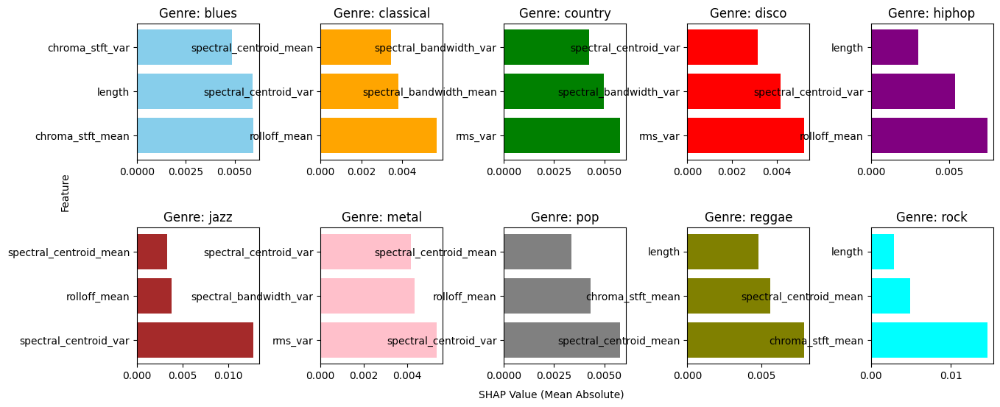

In [ ]:
import matplotlib.pyplot as plt

label_names = label_encoder.inverse_transform(unique_labels)

# Define una lista de colores
colors = ['skyblue', 'orange', 'green', 'red', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan']

# Define el número de filas y columnas para la cuadrícula de subgráficos
n_rows = 2
n_cols = 5

# Crea una figura y un conjunto de subgráficos
fig, axs = plt.subplots(n_rows, n_cols, figsize=(15, 6))

# Ajusta el espacio entre los subgráficos
plt.subplots_adjust(hspace=0.5, wspace=0.5)

# Para cada clase, visualiza la importancia de las características
for idx, label in enumerate(unique_labels):
    # Obtén los valores SHAP para la clase actual
    class_shap_values = shap_values[label]

    # Calcula la importancia promedio de las características para la clase actual
    mean_shap_values = np.abs(class_shap_values.values).mean(axis=0)

    # Ordena las características por importancia
    sorted_indices = np.argsort(-mean_shap_values)

    # Selecciona las top N características más importantes
    top_features = X_test.columns[sorted_indices[:3]]
    top_shap_values = mean_shap_values[sorted_indices[:3]]

    # Selecciona el subgráfico actual
    ax = axs[idx // n_cols, idx % n_cols]

    # Crea un gráfico de barras en el subgráfico seleccionado
    ax.barh(top_features, top_shap_values, color=colors[idx % len(colors)])
    ax.set_title(f'Genre: {label_names[idx]}')

# Añade etiquetas a los ejes x e y para toda la figura
fig.text(0.5, 0.04, 'SHAP Value (Mean Absolute)', ha='center', va='center')
fig.text(0.06, 0.5, 'Feature', ha='center', va='center', rotation='vertical')

# Muestra la figura
plt.show()


Interpretación:
Observar que las mismas características aparecen como importantes para diferentes géneros, aunque con diferente orden e importancia, es un fenómeno interesante. Aquí hay algunas interpretaciones posibles:

Características Universales: Las características que aparecen consistentemente para diferentes géneros pueden ser fundamentales para la música en general. Estas características podrían ser esenciales para describir y diferenciar sonidos y, por lo tanto, son cruciales para la clasificación de géneros.

Diferencias Sutiles: Aunque las características sean las mismas, las diferencias en su importancia y orden reflejan las sutilezas en cómo cada género utiliza estas características. Por ejemplo, un género puede depender más del ritmo, mientras que otro puede centrarse más en la textura o timbre del sonido.

Limitación del Modelo: Si el modelo no puede capturar la complejidad completa y la diversidad de los géneros musicales, podría depender de un conjunto limitado de características. En este caso, es crucial explorar modelos más complejos o características adicionales que puedan capturar mejor las diferencias entre géneros.

Necesidad de Más Características Diversas: Si las mismas características son importantes para todos los géneros, puede ser útil explorar y añadir más características que puedan ayudar a diferenciar mejor entre los géneros.

### Analisis de features del modelo II

In [ ]:
# Check if feature names and order are the same in X_train and X_test
if list(X_train.columns) != list(X_test.columns):
    raise ValueError("Feature names or order do not match between X_train and X_test")

X has feature names, but ExtraTreesClassifier was fitted without feature names
X has feature names, but ExtraTreesClassifier was fitted without feature names
X has feature names, but ExtraTreesClassifier was fitted without feature names
X has feature names, but ExtraTreesClassifier was fitted without feature names
X has feature names, but ExtraTreesClassifier was fitted without feature names
X has feature names, but ExtraTreesClassifier was fitted without feature names
X has feature names, but ExtraTreesClassifier was fitted without feature names
X has feature names, but ExtraTreesClassifier was fitted without feature names
X has feature names, but ExtraTreesClassifier was fitted without feature names
X has feature names, but ExtraTreesClassifier was fitted without feature names
X has feature names, but ExtraTreesClassifier was fitted without feature names
X has feature names, but ExtraTreesClassifier was fitted without feature names
X has feature names, but ExtraTreesClassifier was fi

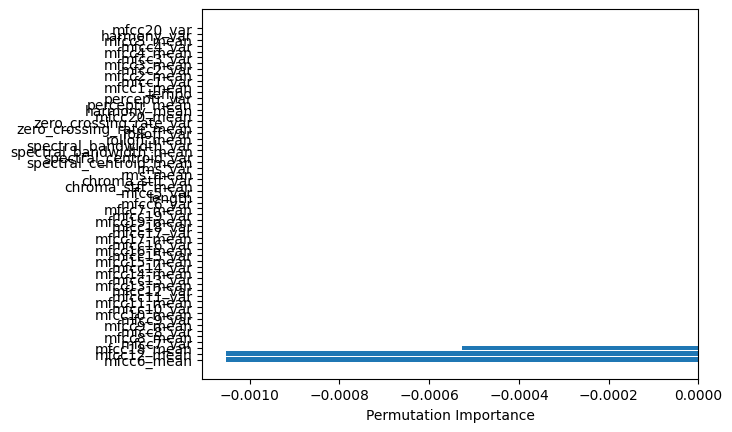

In [ ]:
from sklearn.inspection import permutation_importance
import matplotlib.pyplot as plt

best_classifier = best_model.named_steps['model']

result = permutation_importance(best_classifier, X_test, y_test, n_repeats=10, random_state=0)

sorted_idx = result.importances_mean.argsort()

plt.barh(X_test.columns[sorted_idx], result.importances_mean[sorted_idx])
plt.xlabel("Permutation Importance")
plt.show()


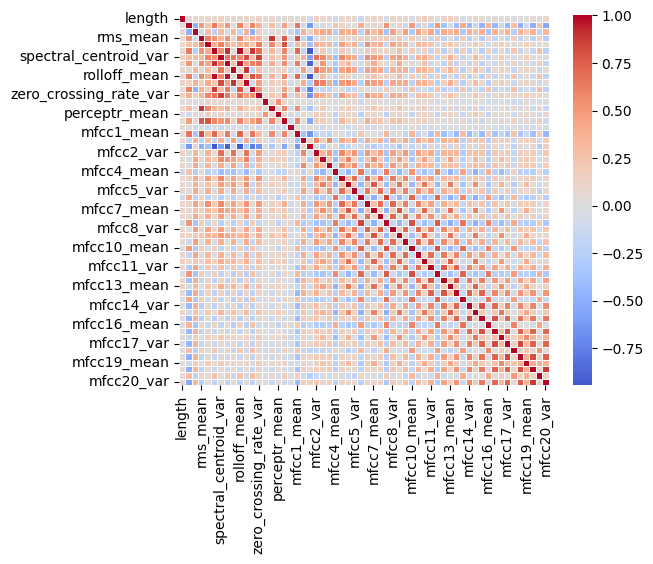

In [ ]:
import seaborn as sns

# Compute the correlation matrix
corr = X_train.corr()

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, cmap='coolwarm', center=0, square=True, linewidths=.5)
plt.show()

2. Permutation Importance:

How It Works: After the model is trained, this method shuffles the values of each feature one at a time and measures the decrease in the model's performance (like accuracy or F1 score). The idea is that if permuting a feature's values leads to a significant performance drop, that feature is important.

Advantages:

Unbiased: It doesn't favor features with more categories.

Interpretable: Provides a straightforward understanding of a feature's contribution to model performance.


Limitations:

Computationally Expensive: Requires multiple evaluations of the model's performance, which might be time-consuming for large datasets.